<h1>Import libraries necessary for this project</h1>

In [1]:
import xarray as xr
import pandas as pd
import numpy as np
import hvplot.xarray 
import seaborn as sns
import pymannkendall as pmk
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from scipy import stats

<h1>Load the dataset</h1>

In [2]:
temp_avg = 'Complete_TAVG_LatLong1.nc'
temp_min = 'Complete_TMIN_LatLong1.nc'
temp_max = 'Complete_TMAX_LatLong1.nc'
avgda = xr.open_dataset(temp_avg)
minda = xr.open_dataset(temp_min)
maxda = xr.open_dataset(temp_max)

<h1>Check for null values</h1>

In [3]:
def check_nullvalues(frame):
    return frame['temperature'].isnull().sum().values

print(check_nullvalues(avgda))
print(check_nullvalues(minda))
print(check_nullvalues(maxda))

164532883
96681035
97069674


A large number of data points are missing.

<h1>Check for duplicate values</h1>

In [4]:
def check_duplicates(frame):
    idx = pd.Index(frame['time'])
    idx_count = idx.duplicated(keep=False)
    num_true = (idx_count == True).sum()
    num_false = (idx_count == False).sum()
    return f"False: {num_false} True: {num_true}"

print(check_duplicates(avgda))
print(check_duplicates(minda))
print(check_duplicates(maxda))

False: 3272 True: 0
False: 2071 True: 0
False: 2071 True: 0


<h1>Converting datetime</h1>

In [5]:
def convert_date(fdate):
    year = int(fdate)
    month = int((fdate - year) * 12) + 1
    return f'{month:02d}{year:04d}'

avgda['time'] = pd.to_datetime(xr.apply_ufunc(convert_date, avgda.time, vectorize=True), format='%m%Y')
minda['time'] = pd.to_datetime(xr.apply_ufunc(convert_date, minda.time, vectorize=True), format='%m%Y')
maxda['time'] = pd.to_datetime(xr.apply_ufunc(convert_date, maxda.time, vectorize=True), format='%m%Y')

<h1>Calculating Statistics</h1>

In [6]:
def check_shape(frame):
    return frame['temperature'].shape

print(check_shape(avgda))
print(check_shape(minda))
print(check_shape(maxda))

(3272, 180, 360)
(2071, 180, 360)
(2071, 180, 360)


Dimensions are: (time, latitude, longitude)

<h1>We'll start with calculating some descriptive statistics about our dataset.</h1>

In [7]:
def stats_(frame):
    count_ = frame['temperature'].count().values
    min_ = frame['temperature'].min().values
    max_ = frame['temperature'].max().values
    median_ = frame['temperature'].median().values
    mean_ = frame['temperature'].mean().values
    std_ = frame['temperature'].std().values
    quantile_25 = frame['temperature'].quantile(0.25).values
    quantile_75 = frame['temperature'].quantile(0.75).values
    quantile_95 = frame['temperature'].quantile(0.95).values
    data = {'Count': count_, 
            'Min': min_, 'Max': max_, 
            'Median': median_, 'Mean': mean_, 'Standard Deviation': std_,
            '25th Quantile': quantile_25, '75th Quantile': quantile_75, '95th Quantile': quantile_95}
    df = pd.DataFrame(data, index=[0])
    return df

In [13]:
print(stats_(avgda))

      Count        Min        Max    Median      Mean  Standard Deviation  \
0  47492717 -16.157808  17.801603 -0.087426 -0.023689            1.736317   

   25th Quantile  75th Quantile  95th Quantile  
0      -0.943613       0.840575       2.983199  


In [14]:
print(stats_(minda))

      Count        Min        Max    Median      Mean  Standard Deviation  \
0  37519765 -14.715576  17.299532 -0.102648 -0.008658            1.798302   

   25th Quantile  75th Quantile  95th Quantile  
0      -0.975477       0.867956       3.052768  


In [15]:
print(stats_(maxda))

      Count        Min        Max    Median      Mean  Standard Deviation  \
0  37131126 -17.229189  18.769215  0.094449  0.176363            1.769102   

   25th Quantile  75th Quantile  95th Quantile  
0        -0.7746       1.065051       3.238787  


<h1>As a case study, we will only consider the USA, but we will also take a look at the temperature around the globe.</h1>

In [8]:
avg_ = avgda['temperature'].sel(latitude=slice(26, 48), longitude=slice(-123, -71))
min_ = minda['temperature'].sel(latitude=slice(26, 48), longitude=slice(-123, -71))
max_ = maxda['temperature'].sel(latitude=slice(26, 48), longitude=slice(-123, -71))

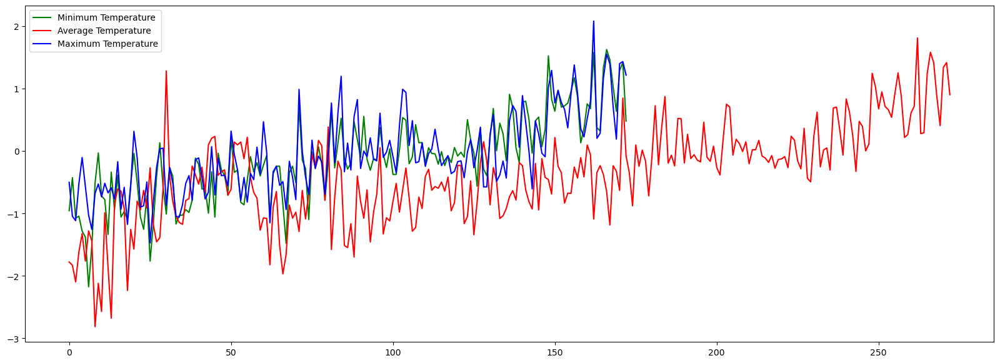

In [9]:
fig, ax = plt.subplots(1, 1, figsize=(20, 7))
ax.plot(min_.groupby('time.year').mean(...), color='g', label='Minimum Temperature')
ax.plot(avg_.groupby('time.year').mean(...), color='r', label='Average Temperature')
ax.plot(max_.groupby('time.year').mean(...), color='b', label='Maximum Temperature')
plt.legend()
plt.show()

A trend of increasing temperatures can be observed. During 1760-1800, there is an increase in the average temperature. 

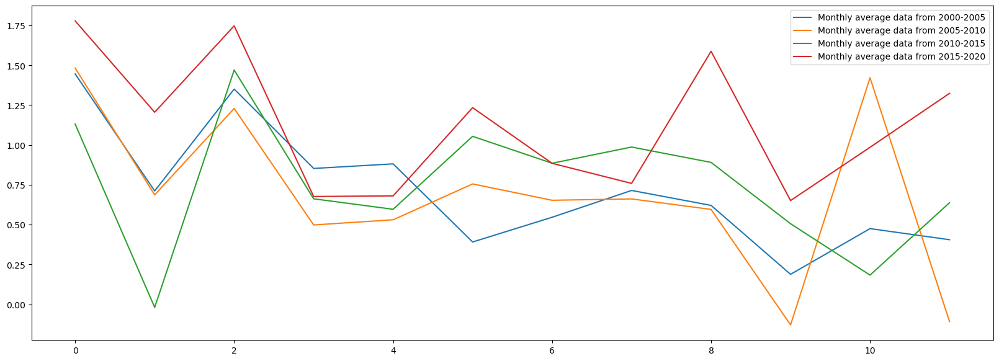

In [10]:
fig, ax = plt.subplots(1, 1, figsize=(20, 7))
ax.plot(avg_.sel(time=slice('2000-01-01', '2005-01-01')).groupby('time.month').mean(...), label='Monthly average data from 2000-2005')
ax.plot(avg_.sel(time=slice('2005-01-01', '2010-01-01')).groupby('time.month').mean(...), label='Monthly average data from 2005-2010')
ax.plot(avg_.sel(time=slice('2010-01-01', '2015-01-01')).groupby('time.month').mean(...), label='Monthly average data from 2010-2015')
ax.plot(avg_.sel(time=slice('2015-01-01', '2020-01-01')).groupby('time.month').mean(...), label='Monthly average data from 2015-2020')
plt.legend()
plt.show()

From the above chart we can conclude that the average monthly temperature over the period of 2000-2020 shows similar pattern. For the months January, March, the average monthly temperature rises and falls during rainy and winter season. We would have to visualize the seasonality in data for a better understanding.

The data has missing values which shows the irregular dips and spikes in the chart.

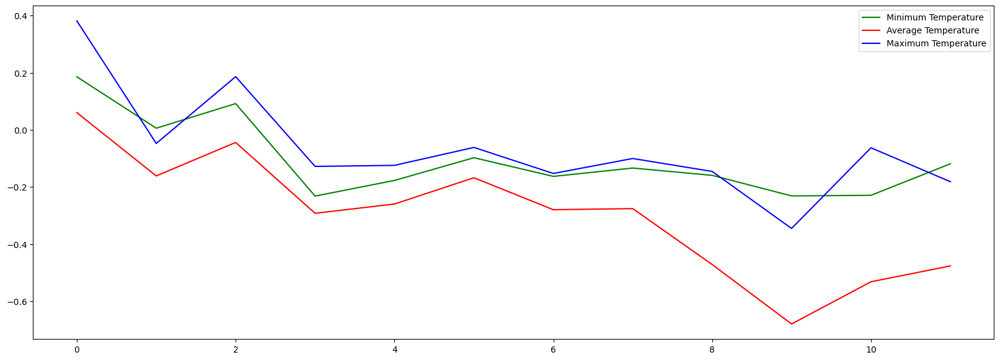

In [11]:
fig, ax = plt.subplots(1, 1, figsize=(20, 7))
ax.plot(min_.groupby('time.month').median(...), color='g', label='Minimum Temperature')
ax.plot(avg_.groupby('time.month').median(...), color='r', label='Average Temperature')
ax.plot(max_.groupby('time.month').median(...), color='b', label='Maximum Temperature')
plt.legend()
plt.show()

Median monthly temperature trend shows some similar seasonality between minimum, maximum and average temperature over the years.

In [12]:
print(avg_.mean('time').min())
print(avg_.mean('time').max())

<xarray.DataArray 'temperature' ()>
array(-0.44281605)
<xarray.DataArray 'temperature' ()>
array(0.02542921)


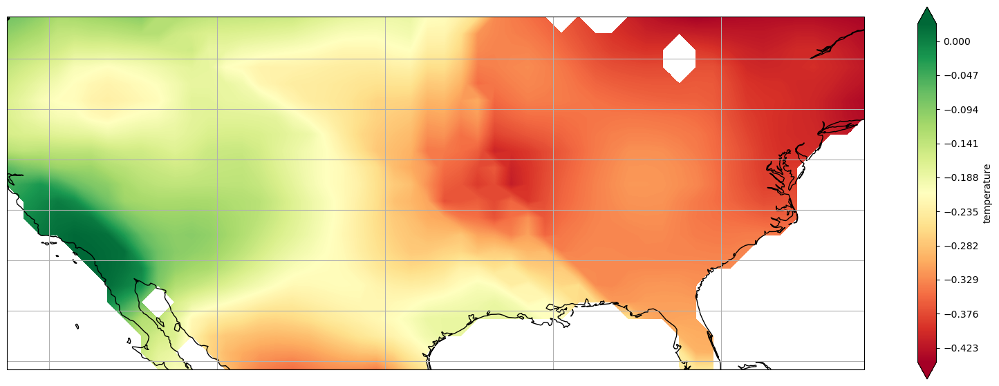

In [13]:
fig = plt.figure(figsize=[20, 7])

ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

avg_.mean('time').plot.contourf(ax=ax,
                   extend='both',
                   levels=np.arange(-0.443, 0.025, 0.001),
                   alpha=1,
                   transform=ccrs.PlateCarree(),
                   cmap='RdYlGn')
ax.coastlines()
plt.gca().gridlines()
plt.show()

Towards the west, the temperature rises, while the east and north have low to normal temperatures

<p>We will visualzie the temperature during Pontiac's War, which was launched in 1763 by a loose confederation of Native Americans dissatisfied with British rule in the Great Lakes region following the French and Indian War (1754–1763). Illinois, Indiana, Michigan, Minnesota, New York, Ohio, Pennsylvania and Wisconsin are considered the Great Lakes region</p>

In [14]:
avg_.sel(time=slice('1754-01-01', '1763-01-01')).groupby('time.year').mean(...)

<xarray.DataArray 'temperature' (year: 10)>
array([-1.3233684, -1.7637731, -1.2779533, -1.4420582, -2.8138316,
       -2.1181965, -2.5711617, -0.9880336, -1.857729 , -3.6248493],
      dtype=float32)
Coordinates:
  * year     (year) int64 1754 1755 1756 1757 1758 1759 1760 1761 1762 1763

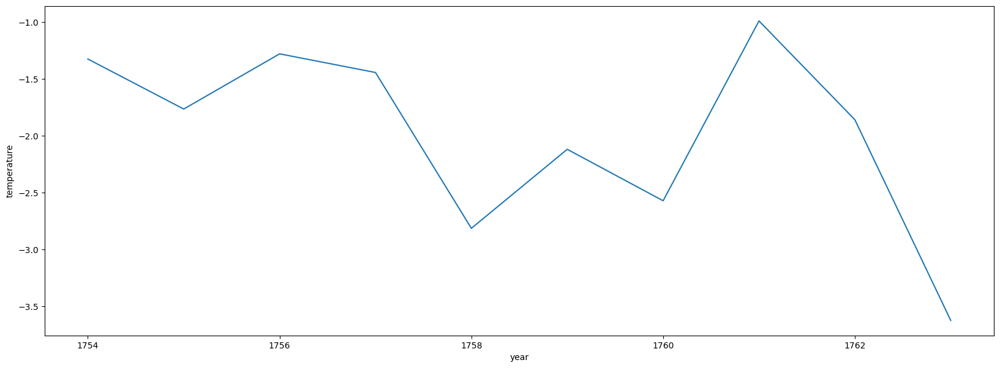

In [15]:
avg_.sel(time=slice('1754-01-01', '1763-01-01')).groupby('time.year').mean(...).plot(figsize=(20, 7))

In [16]:
print(avg_.sel(time=slice('1754-01-01', '1763-01-01')).min())
print(avg_.sel(time=slice('1754-01-01', '1763-01-01')).max())

<xarray.DataArray 'temperature' ()>
array(-6.49451828)
<xarray.DataArray 'temperature' ()>
array(4.37168455)


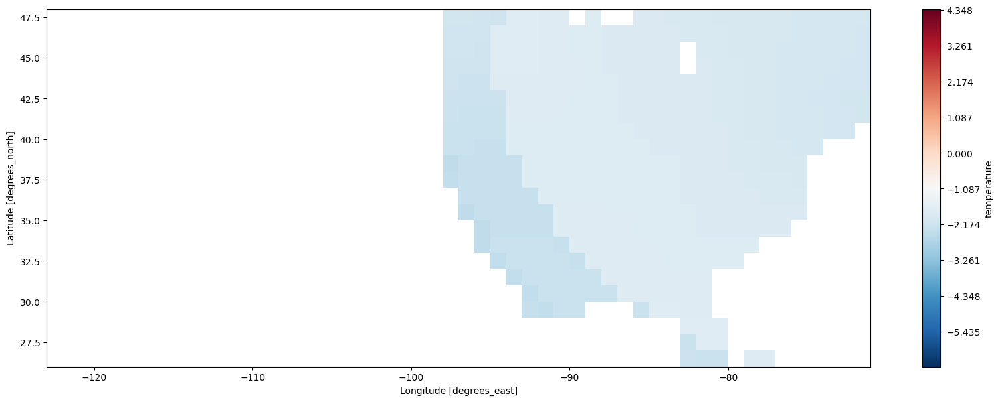

In [17]:
avg_.sel(time=slice('1754-01-01', '1763-01-01')).mean('time').plot(levels=np.arange(-6.496, 4.372, 0.001), figsize=(20, 7))

There are a lot of missing data points that show why the average temperature is mostly negative during the early period.

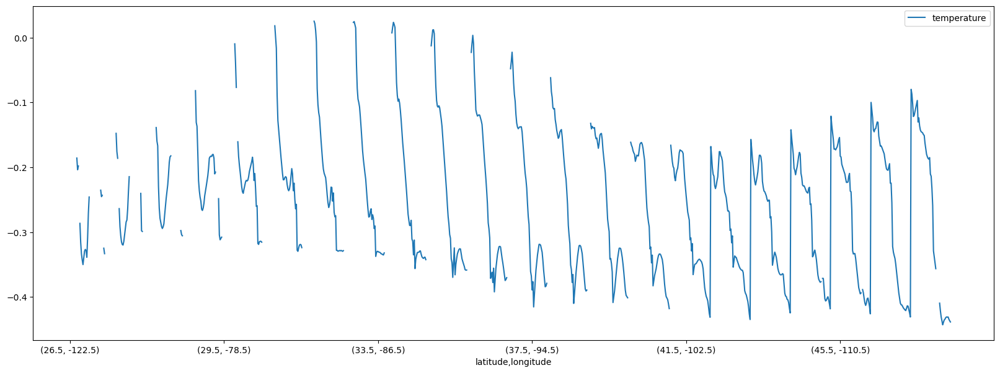

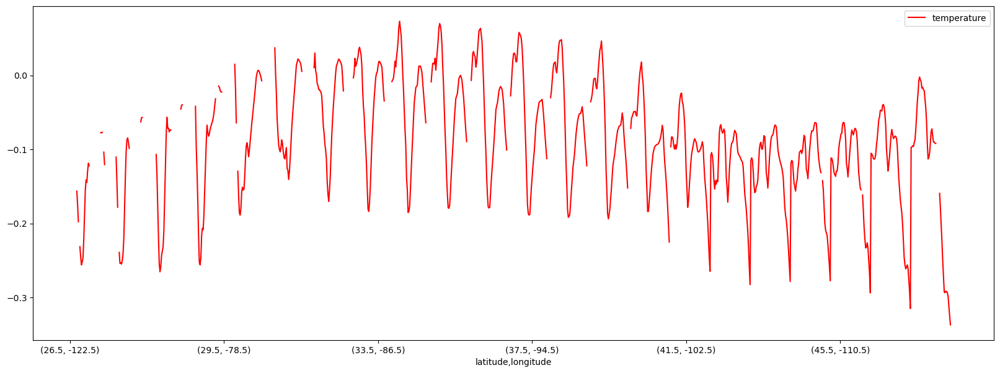

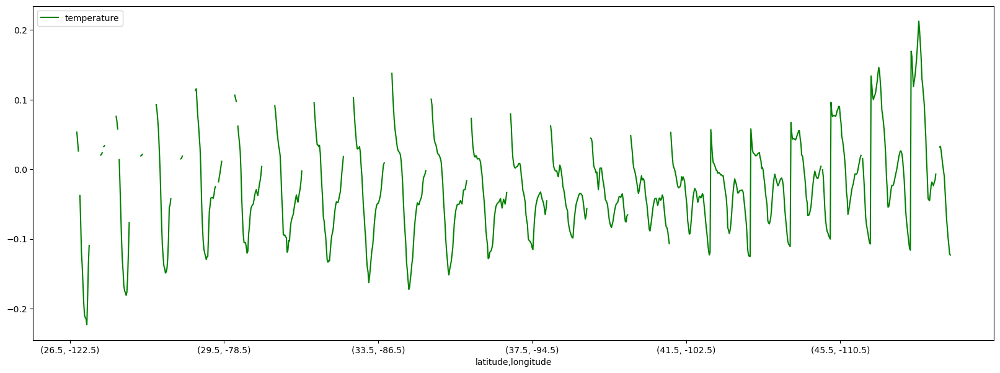

In [18]:
avg_.mean(dim='time').to_dataframe().plot(figsize=(20, 7))
min_.mean(dim='time').to_dataframe().plot(figsize=(20, 7), color='r')
max_.mean(dim='time').to_dataframe().plot(figsize=(20, 7), color='g')
plt.show()

Mean temperature over the latitude and longitude shows an increase in temperature with increase in latiude, as the altitude increase temperature increases. As we move farther from equator the temperature decreases that is why the temperatrue for contries in USA which are closer to equator are warmer compared to others.

In [19]:
avg_.sel()

<xarray.DataArray 'temperature' (time: 3272, latitude: 22, longitude: 52)>
array([[[      nan,       nan, ...,       nan,       nan],
        [      nan,       nan, ...,       nan,       nan],
        ...,
        [      nan,       nan, ..., -2.433267, -2.514333],
        [      nan,       nan, ..., -2.451321, -2.505975]],

       [[      nan,       nan, ...,       nan,       nan],
        [      nan,       nan, ...,       nan,       nan],
        ...,
        [      nan,       nan, ..., -2.421485, -2.424216],
        [      nan,       nan, ..., -2.495591, -2.500971]],

       ...,

       [[      nan,       nan, ...,       nan,       nan],
        [      nan,       nan, ...,       nan,       nan],
        ...,
        [ 2.518102,  2.63113 , ...,  0.795397,  0.8742  ],
        [ 2.459702,  2.553512, ...,  0.705069,  0.793112]],

       [[      nan,       nan, ...,       nan,       nan],
        [      nan,       nan, ...,       nan,       nan],
        ...,
        [ 3.55194 ,  3.830741, ...,  1.855092,  1.916074],
        [ 3.666879,  3.899827, ...,  1.833344,  1.8929  ]]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 -122.5 -121.5 -120.5 ... -73.5 -72.5 -71.5
  * latitude   (latitude) float32 26.5 27.5 28.5 29.5 ... 44.5 45.5 46.5 47.5
  * time       (time) datetime64[ns] 1750-01-01 1750-02-01 ... 2022-08-01
Attributes:
    units:          degree C
    standard_name:  surface_temperature_anomaly
    long_name:      Air Surface Temperature Anomaly
    valid_min:      -16.157808962976674
    valid_max:      17.801603062683395

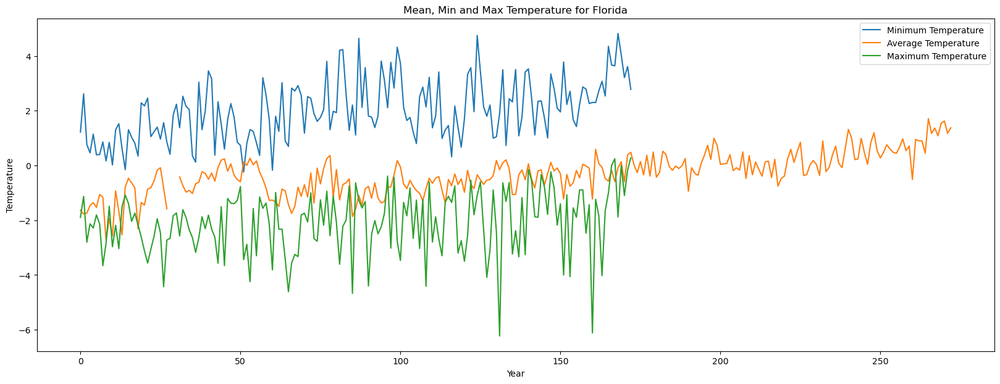

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(20, 7))
ax.plot(max_.sel(latitude=27.5, longitude=-81.5).groupby('time.year').max(...), label='Minimum Temperature')
ax.plot(avg_.sel(latitude=27.5, longitude=-81.5).groupby('time.year').mean(...), label='Average Temperature')
ax.plot(min_.sel(latitude=27.5, longitude=-81.5).groupby('time.year').min(...), label='Maximum Temperature')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.title('Mean, Min and Max Temperature for Florida')
plt.legend()
plt.show()

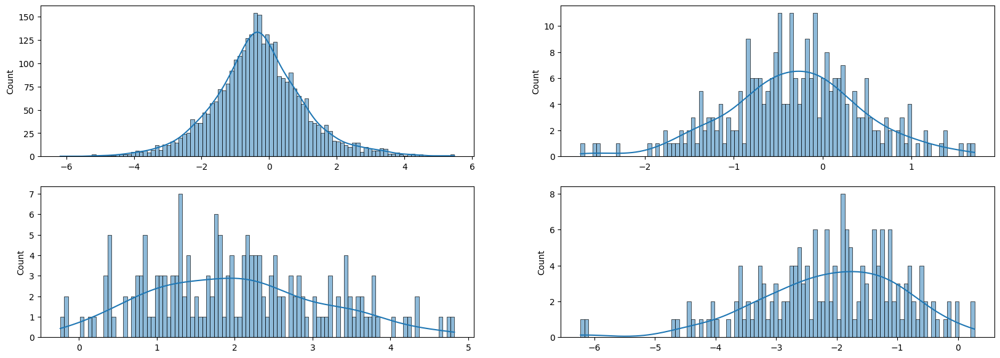

In [21]:
fig, ax = plt.subplots(2, 2, figsize=(20, 7))
sns.histplot(avg_.sel(latitude=27.5, longitude=-81.5), kde=True, bins=100, ax=ax[0][0])
sns.histplot(avg_.sel(latitude=27.5, longitude=-81.5).groupby('time.year').mean(...), kde=True, bins=100, ax=ax[0][1])
sns.histplot(max_.sel(latitude=27.5, longitude=-81.5).groupby('time.year').max(...), kde=True, bins=100, ax=ax[1][0])
sns.histplot(min_.sel(latitude=27.5, longitude=-81.5).groupby('time.year').min(...), kde=True, bins=100, ax=ax[1][1])
plt.show()

In [22]:
max_.sel(latitude=27.5, longitude=-81.5, time=slice('1991-01-01', '2020-01-01')).groupby('time.year').mean()

<xarray.DataArray 'temperature' (year: 30)>
array([ 0.76503056,  0.06688536,  0.18322545,  0.7427407 ,  0.21470277,
        0.07696114,  0.66248375,  0.9262765 ,  0.6373894 ,  0.6187921 ,
        0.51320744,  0.7321816 ,  0.55282587,  0.4719211 ,  0.23138142,
        0.8014183 ,  0.94487745,  0.5446098 ,  0.80732876, -0.39485916,
        1.0985548 ,  0.8889578 ,  0.8000396 ,  0.5820295 ,  1.51717   ,
        1.1077307 ,  1.4560294 ,  1.0820383 ,  1.4912816 ,  1.9858541 ],
      dtype=float32)
Coordinates:
    longitude  float32 -81.5
    latitude   float32 27.5
  * year       (year) int64 1991 1992 1993 1994 1995 ... 2017 2018 2019 2020

In [23]:
max_.sel(latitude=27.5, longitude=-81.5, time=slice('1991-01-01', '2020-01-01')).groupby('time.year').mean().mean()

<xarray.DataArray 'temperature' ()>
array(0.7369689, dtype=float32)
Coordinates:
    longitude  float32 -81.5
    latitude   float32 27.5

In [24]:
max_.sel(latitude=27.5, longitude=-81.5, time=slice('1991-01-01', '2020-01-01')).groupby('time.month').mean()

<xarray.DataArray 'temperature' (month: 12)>
array([0.55155104, 1.365944  , 0.48928684, 0.4119298 , 0.5049108 ,
       0.62669635, 0.5946045 , 0.57679796, 0.5457745 , 0.87819266,
       0.74152267, 1.0890937 ], dtype=float32)
Coordinates:
    longitude  float32 -81.5
    latitude   float32 27.5
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [25]:
max_.sel(latitude=27.5, longitude=-81.5, time=slice('1991-01-01', '2020-01-01')).groupby('time.month').mean().mean()

<xarray.DataArray 'temperature' ()>
array(0.6980254, dtype=float32)
Coordinates:
    longitude  float32 -81.5
    latitude   float32 27.5

In [26]:
max_.sel(latitude=27.5, longitude=-81.5, time=slice('2021-01-01', '2021-12-31')).groupby('time.month').mean().mean()

<xarray.DataArray 'temperature' ()>
array(1.216714, dtype=float32)
Coordinates:
    longitude  float32 -81.5
    latitude   float32 27.5

Florida is the hottest state in the U.S., with an average annual temperature of 0.766 degree Celcius between 1991 and 2020. It is the southernmost contiguous U.S. state with a subtropical climate in its northern and central regions and a tropical climate in its southern regions. Winters are mild, and summers are hot and humid. 
For the period 1991 to 2020 mean monthly temperature of Florida, was found to be 1.36 degree Celcius.

In 2019, temperatures in the state rose even higher, with a state-wide average of 1.49 degree Celcius. The highest temperature recorded in 2021 was 1.98 degree Celcius.

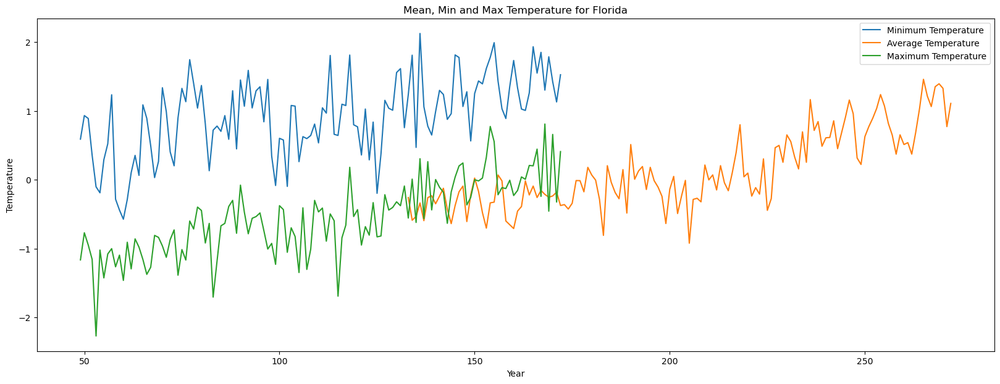

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(20, 7))
ax.plot(maxda['temperature'].sel(latitude=19.5, longitude=-155.5).groupby('time.year').max(...), label='Minimum Temperature')
ax.plot(avgda['temperature'].sel(latitude=19.5, longitude=-155.5).groupby('time.year').mean(...), label='Average Temperature')
ax.plot(minda['temperature'].sel(latitude=19.5, longitude=-155.5).groupby('time.year').min(...), label='Maximum Temperature')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.title('Mean, Min and Max Temperature for Florida')
plt.legend()
plt.show()

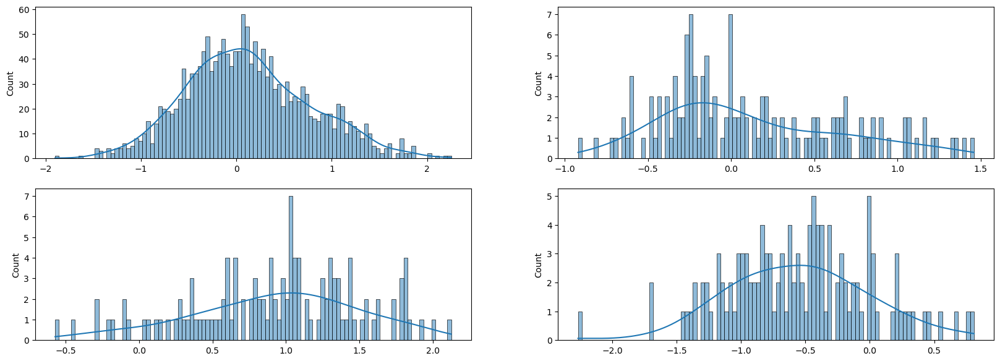

In [28]:
fig, ax = plt.subplots(2, 2, figsize=(20, 7))
sns.histplot(avgda['temperature'].sel(latitude=19.5, longitude=-155.5), kde=True, bins=100, ax=ax[0][0])
sns.histplot(avgda['temperature'].sel(latitude=19.5, longitude=-155.5).groupby('time.year').mean(...), kde=True, bins=100, ax=ax[0][1])
sns.histplot(maxda['temperature'].sel(latitude=19.5, longitude=-155.5).groupby('time.year').max(...), kde=True, bins=100, ax=ax[1][0])
sns.histplot(minda['temperature'].sel(latitude=19.5, longitude=-155.5).groupby('time.year').min(...), kde=True, bins=100, ax=ax[1][1])
plt.show()

In [29]:
avgda['temperature'].sel(latitude=19.5, longitude=-155.5, time=slice('1991-01-01', '2020-01-01')).groupby('time.year').min()

<xarray.DataArray 'temperature' (year: 30)>
array([-0.03192995,  0.14817518, -0.34370315, -0.11207633,  0.33292946,
        0.19822575,  0.29093888, -0.28902745, -0.02809632, -0.14440647,
        0.18602511,  0.09917133,  0.63075131,  0.92770481,  0.45044696,
       -0.12324299,  0.31914696, -0.10767699, -0.4256334 ,  0.08607838,
        0.05891875, -0.1576913 ,  0.15044676,  0.51591039,  0.52112693,
        0.67739236,  0.08412602,  0.83570451,  0.0705866 ,  1.51003671])
Coordinates:
    longitude  float32 -155.5
    latitude   float32 19.5
  * year       (year) int64 1991 1992 1993 1994 1995 ... 2017 2018 2019 2020

In [30]:
avgda['temperature'].sel(latitude=19.5, longitude=-155.5, time=slice('1991-01-01', '2020-01-01')).groupby('time.year').mean()

<xarray.DataArray 'temperature' (year: 30)>
array([0.6147118 , 0.8571287 , 0.4520584 , 0.6775375 , 0.90585274,
       1.158188  , 0.95916075, 0.31685355, 0.22291946, 0.6287238 ,
       0.77284414, 0.893516  , 1.0354413 , 1.2373942 , 1.0732652 ,
       0.8191335 , 0.649748  , 0.37259483, 0.65333724, 0.5120762 ,
       0.5397195 , 0.37296167, 0.68534803, 1.0362531 , 1.4594764 ,
       1.2141083 , 1.0638217 , 1.3519206 , 1.394612  , 1.5100367 ],
      dtype=float32)
Coordinates:
    longitude  float32 -155.5
    latitude   float32 19.5
  * year       (year) int64 1991 1992 1993 1994 1995 ... 2017 2018 2019 2020

In [31]:
avgda['temperature'].sel(latitude=19.5, longitude=-155.5, time=slice('1991-01-01', '2020-01-01')).groupby('time.year').mean().mean()

<xarray.DataArray 'temperature' ()>
array(0.8480247, dtype=float32)
Coordinates:
    longitude  float32 -155.5
    latitude   float32 19.5

In [32]:
avgda['temperature'].sel(latitude=19.5, longitude=-155.5).groupby('time.year').mean().mean()

<xarray.DataArray 'temperature' ()>
array(0.12266491, dtype=float32)
Coordinates:
    longitude  float32 -155.5
    latitude   float32 19.5

In [33]:
avgda['temperature'].sel(latitude=19.5, longitude=-155.5, time=slice('1991-01-01', '2020-01-01')).groupby('time.year').min()

<xarray.DataArray 'temperature' (year: 30)>
array([-0.03192995,  0.14817518, -0.34370315, -0.11207633,  0.33292946,
        0.19822575,  0.29093888, -0.28902745, -0.02809632, -0.14440647,
        0.18602511,  0.09917133,  0.63075131,  0.92770481,  0.45044696,
       -0.12324299,  0.31914696, -0.10767699, -0.4256334 ,  0.08607838,
        0.05891875, -0.1576913 ,  0.15044676,  0.51591039,  0.52112693,
        0.67739236,  0.08412602,  0.83570451,  0.0705866 ,  1.51003671])
Coordinates:
    longitude  float32 -155.5
    latitude   float32 19.5
  * year       (year) int64 1991 1992 1993 1994 1995 ... 2017 2018 2019 2020

Alaska is the coldest state in the U.S. Alaska's average temperature is 0.12 and can go as low as -0.15 during the winter months. 
For the period 1991 to 2020 mean monthly temperature of Alaska, was found to be 0.85 degree Celcius.
In 1991, the average temperatures of the state was -0.03 degree Celcius which was the lowest temperature recorded.

In [34]:
print(avg_.min())
print(avg_.max())

<xarray.DataArray 'temperature' ()>
array(-16.1578083)
<xarray.DataArray 'temperature' ()>
array(11.90921402)


In [35]:
avg_.mean(dim='time').hvplot.contourf(z='temperature', x='longitude', y='latitude', levels=np.arange(-16.158, 11.909, 0.001), 
                                   clabel='T [K]', label='Mean Air temperature [K]',
                                   cmap='fire')

:Polygons   [longitude,latitude]   (temperature)

In [36]:
print(avg_.sel(time=slice('1990-01-01', '2022-01-01')).mean(dim='time').min())
print(avg_.sel(time=slice('1990-01-01', '2022-01-01')).mean(dim='time').max())

<xarray.DataArray 'temperature' ()>
array(0.24211985)
<xarray.DataArray 'temperature' ()>
array(0.99008369)


In [37]:
avg_.sel(time=slice('1990-01-01', '2022-01-01')).mean(dim='time').hvplot.contourf(z='temperature', x='longitude', y='latitude',
                                   levels=np.arange(0.242, 0.990, 0.001), 
                                   clabel='T [K]', label='Mean Air temperature [K]',
                                   cmap='fire')

:Polygons   [longitude,latitude]   (temperature)

<h1>Resampling Data for better clarity</h1>

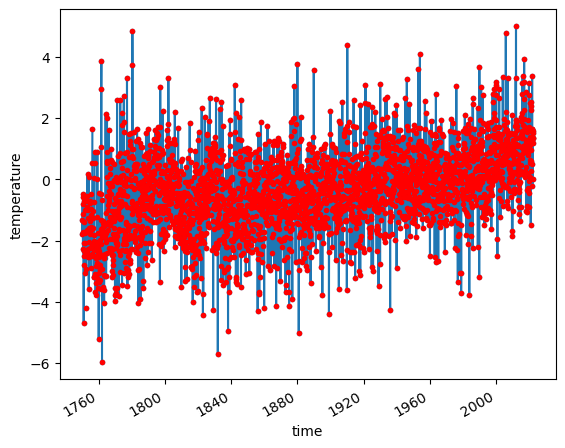

In [38]:
avg_.groupby('time').mean(...).plot(marker='.')
avg_.resample(time='7D').mean(...).plot(marker='.', color='r')

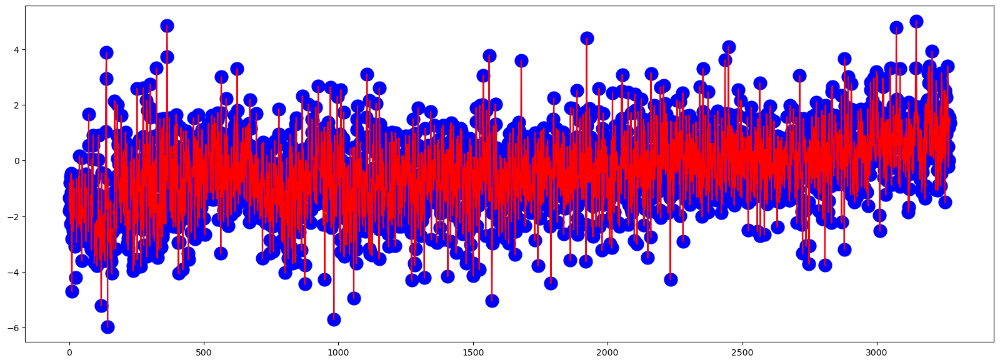

In [39]:
fig, ax = plt.subplots(1, 1, figsize=(20, 7))
ax.plot(avg_.groupby('time').mean(...), color='b', marker='.', markersize=30)
ax.plot(avg_.resample(time='MS').mean(...), color='r', marker='.', markersize=1)

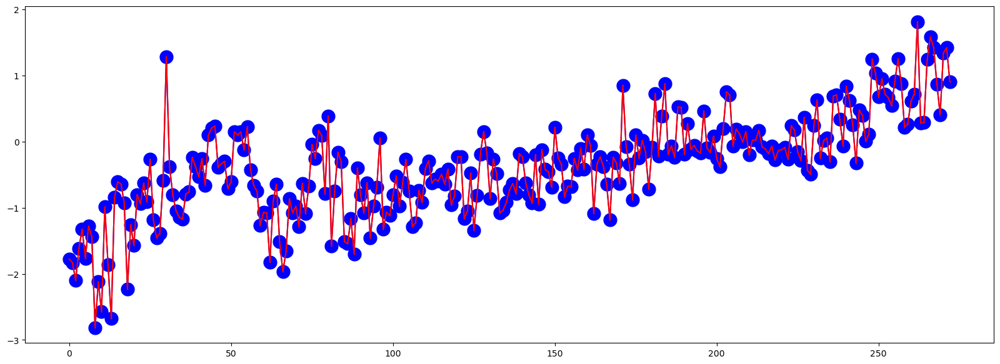

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(20, 7))
ax.plot(avg_.groupby('time.year').mean(...), color='b', marker='.', markersize=30)
ax.plot(avg_.resample(time='Y').mean(...), color='r', marker='.', markersize=1)

Compared to the original data, the moving averages for the week, month, and year show similar patterns of increasing temperatures.

<h1>Temperatures < 0 degree Celcius</h1>

In [55]:
freeze_avgda = avg_.where(avg_ <= 0)

In [56]:
freeze_avgda = freeze_avgda.groupby('time.month').mean('time')

In [57]:
print(freeze_avgda.min())
print(freeze_avgda.max())

<xarray.DataArray 'temperature' ()>
array(-3.40161705)
<xarray.DataArray 'temperature' ()>
array(-0.50662255)


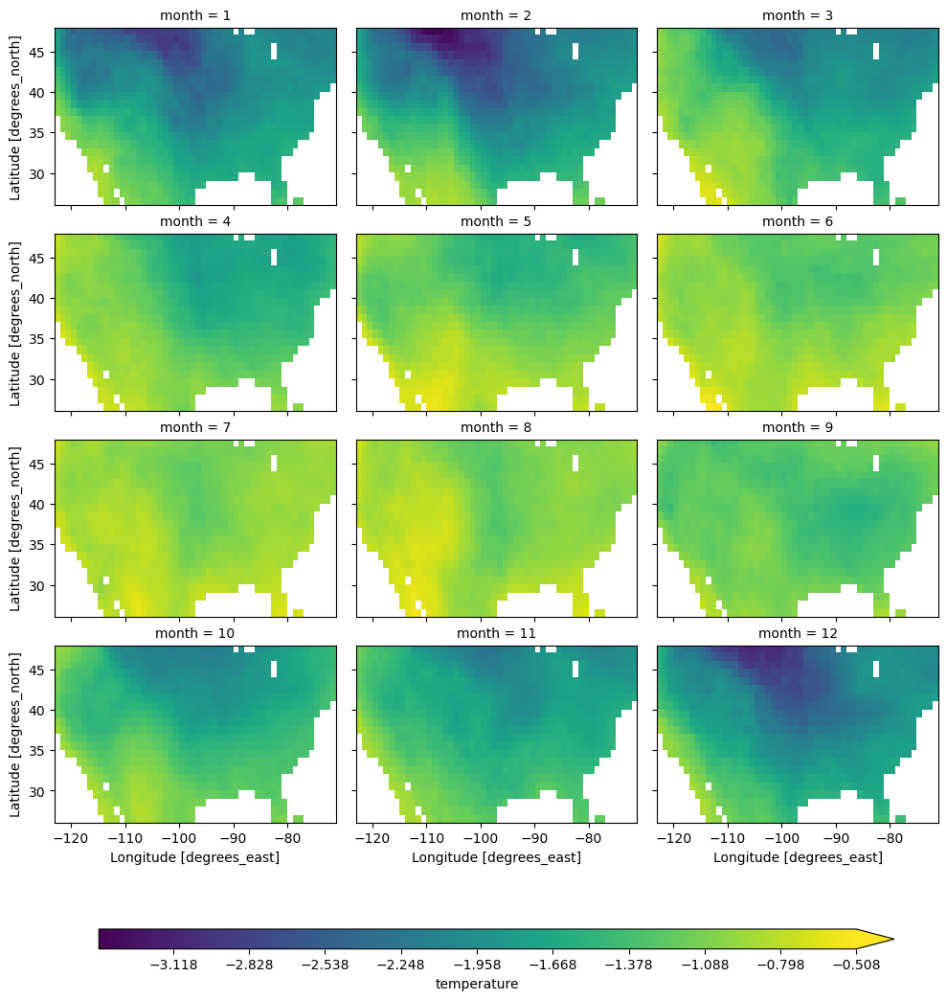

In [58]:
g = freeze_avgda.plot.imshow('longitude', 'latitude', levels=np.arange(-3.402, -0.507, 0.001), col='month', col_wrap=3, robust=True,  cbar_kwargs={
    'orientation': 'horizontal',
    'shrink': 0.9,
    'aspect': 40,
    'pad':0.1
},)

Temperature starts rising during the month of April and reaches its peak during July.

<h1>Creating Seasonal Weights</h1>

In [182]:
month_length = avg_.time.dt.days_in_month
weights = (month_length.groupby('time.season') / month_length.groupby('time.season').sum())
weighted = (avg_ * weights).groupby('time.season').sum(dim='time')
unweighted = avg_.groupby('time.season').mean('time')
diff = weighted - unweighted

In [183]:
print(weighted.min())
print(weighted.max())

print(unweighted.min())
print(unweighted.max())

print(diff.min())
print(diff.max())

<xarray.DataArray ()>
array(-0.78548918)
<xarray.DataArray ()>
array(0.27547529)
<xarray.DataArray 'temperature' ()>
array(-0.7996853)
<xarray.DataArray 'temperature' ()>
array(0.42397255)
<xarray.DataArray ()>
array(-0.15222186)
<xarray.DataArray ()>
array(0.22294155)


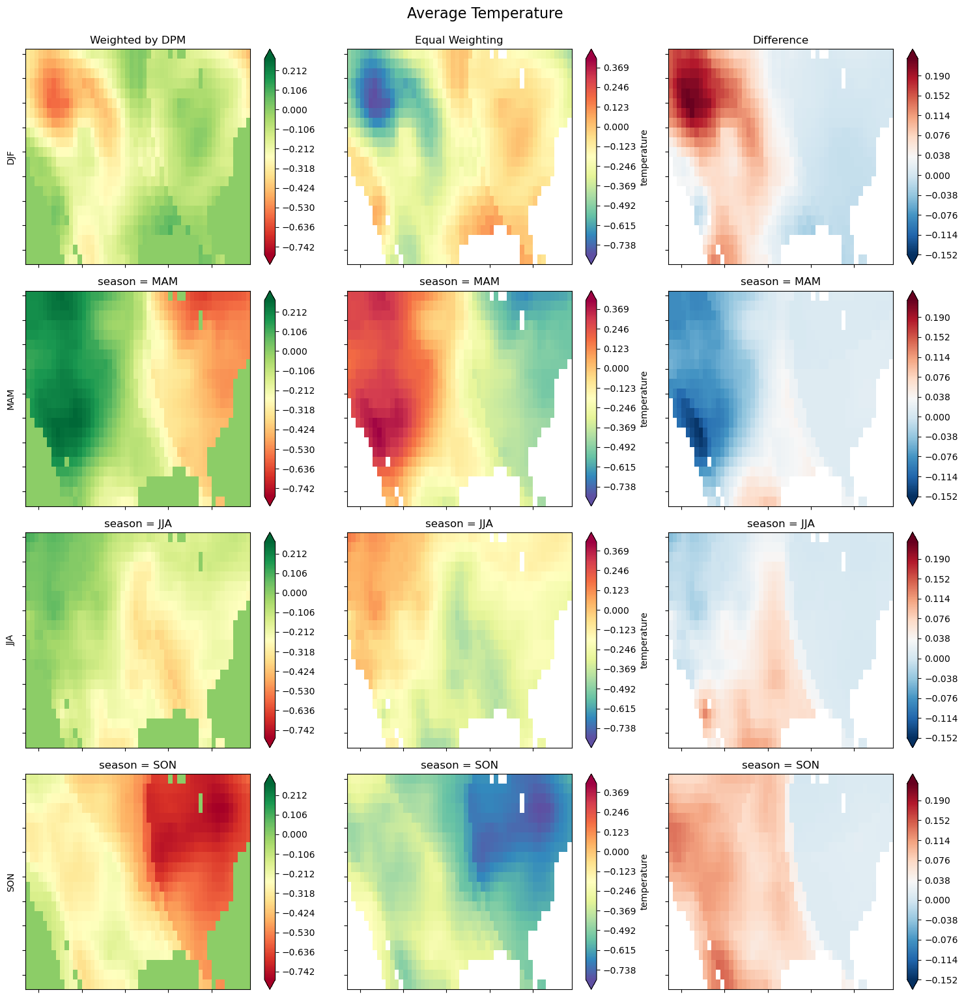

In [184]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15))
for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    weighted.sel(season=season).plot.pcolormesh(ax=axes[i, 0],
                                                        levels=np.arange(-0.785, 0.275, 0.001),
                                                        cmap='RdYlGn', 
                                                        add_colorbar=True, 
                                                        extend='both',)
    unweighted.sel(season=season).plot.pcolormesh(ax=axes[i, 1],
                                                        levels=np.arange(-0.799, 0.424, 0.001),
                                                        cmap='Spectral_r',
                                                        add_colorbar=True,
                                                        extend='both',)
    diff.sel(season=season).plot.pcolormesh(ax=axes[i, 2],
                                                        levels=np.arange(-0.152, 0.223, 0.001),
                                                        cmap='RdBu_r',
                                                        add_colorbar=True,
                                                        extend='both',)
    axes[i, 0].set_ylabel(season)
    axes[i, 1].set_ylabel('')
    axes[i, 2].set_ylabel('')
    
    for ax in axes.flat:
        ax.axes.get_xaxis().set_ticklabels([])
        ax.axes.get_yaxis().set_ticklabels([])
        ax.axes.axis('tight')
        ax.set_xlabel('')
        
axes[0, 0].set_title('Weighted by DPM')
axes[0, 1].set_title('Equal Weighting')
axes[0, 2].set_title('Difference')

plt.tight_layout()

fig.suptitle('Average Temperature', fontsize=16, y=1.02)
plt.show()

June, July, August is the hottest season, while Sept, Oct and Nov is the coldest season

<h1>Creating Weights based on Latitude to remove noise from data</h1>

In [228]:
weights_lat_avg = np.cos(np.deg2rad(avg_.latitude))

In [229]:
tempp_weighted = avg_.weighted(weights_lat_avg.fillna(0))
weighted_mean = tempp_weighted.mean(('longitude', 'latitude'))

<function matplotlib.pyplot.show(close=None, block=None)>

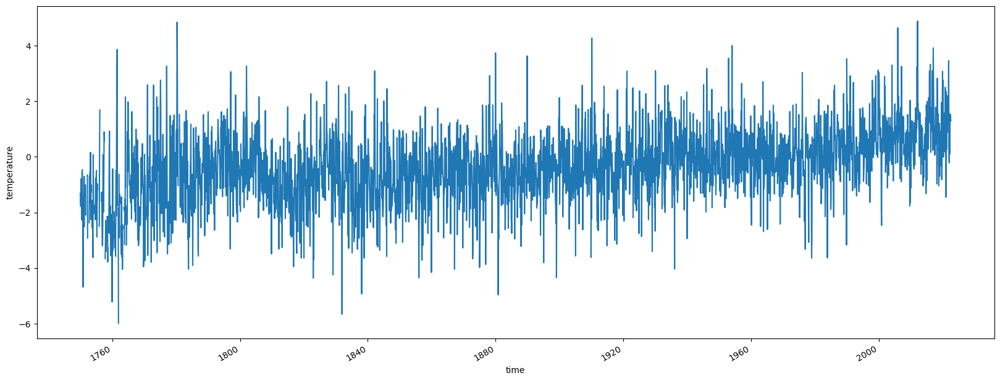

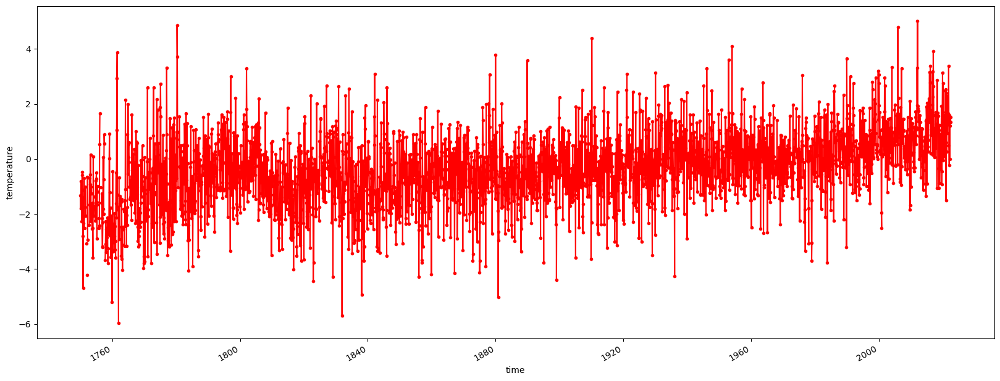

In [234]:
weighted_mean.plot(label='weighted', figsize=(20, 7))
avg_.mean(('longitude', 'latitude')).plot(label='unweighted', figsize=(20, 7), marker='.', color='r')
plt.show

<h1>Calculating anomaly</h1>

In [70]:
gb = avg_.groupby('time.month')
ds_anom = gb - gb.mean('time')

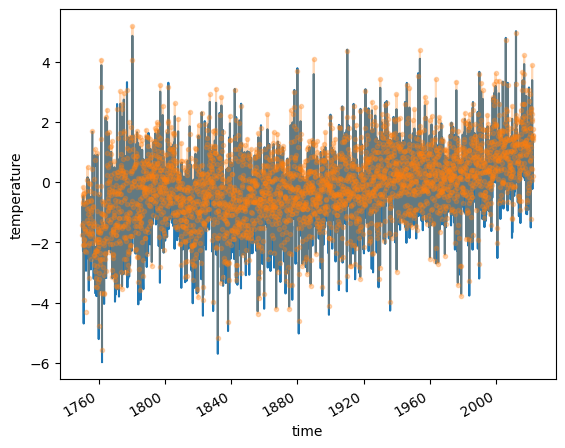

In [78]:
avg_.mean(('latitude', 'longitude')).plot(alpha=1)
ds_anom.mean(('latitude', 'longitude')).plot(alpha=0.3, marker='.')

In [64]:
climatology_mean = avg_.groupby("time.month").mean("time")
climatology_std = avg_.groupby("time.month").std("time")
stand_anomalies = xr.apply_ufunc(
    lambda x, m, s: (x - m) / s,
    avg_.groupby("time.month"),
    climatology_mean,
    climatology_std,
)

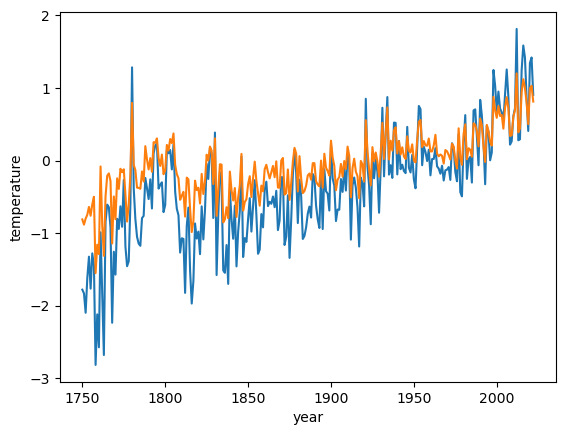

In [68]:
avg_.groupby('time.year').mean(...).plot()
stand_anomalies.groupby('time.year').mean(...).plot()

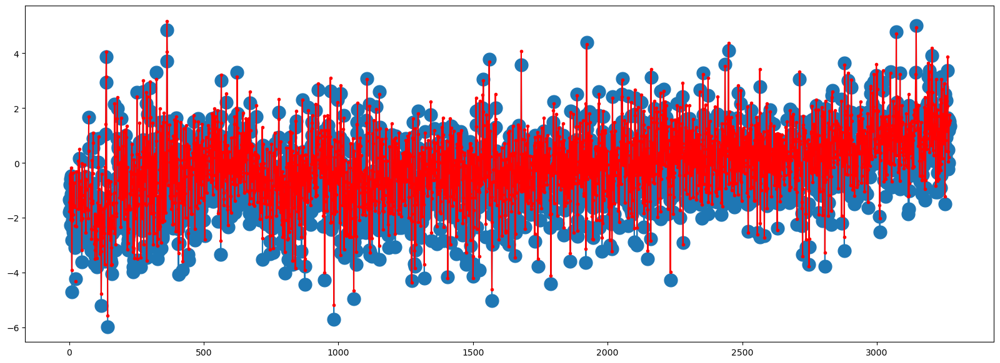

In [254]:
fig, ax = plt.subplots(figsize=(20, 7))
ax.plot(avg_.mean(('latitude', 'longitude')), marker='.', markersize=30)
ax.plot(ds_anom.mean(('latitude', 'longitude')), marker='.', color='r')

In [81]:
temp_avg = avg_.groupby('time.month').mean(dim='time')

In [82]:
print(temp_avg.min())
print(temp_avg.max())

<xarray.DataArray 'temperature' ()>
array(-1.35092831)
<xarray.DataArray 'temperature' ()>
array(1.01848745)


<h1>Average monthly temperature across latitude</h1>

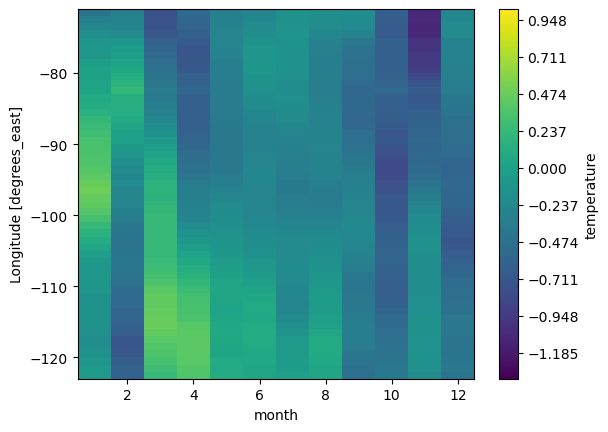

In [87]:
temp_avg.mean(dim='latitude').plot(x='month', levels=np.arange(-1.351, 1.018, 0.001), vmax=-10, vmin=10, alpha=1)

<h1>Average monthly temperature across longitude</h1>

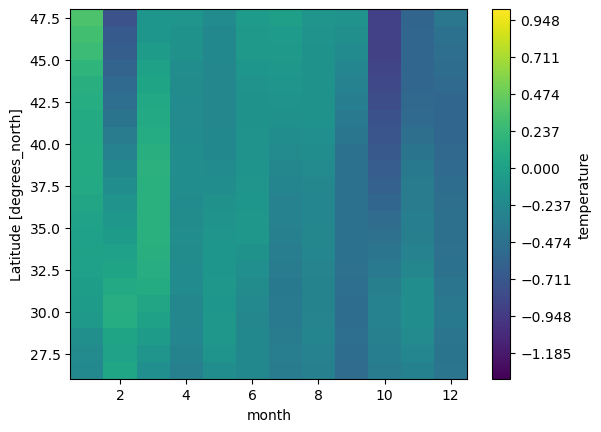

In [89]:
temp_avg.mean(dim='longitude').plot(x='month', levels=np.arange(-1.351, 1.018, 0.001), vmax=-10, vmin=10, alpha=1)

<h1>Cooling Degree Days</h1>

In [90]:
cdd = avg_.where(avg_.values <= 18)
cdd = 18 - cdd

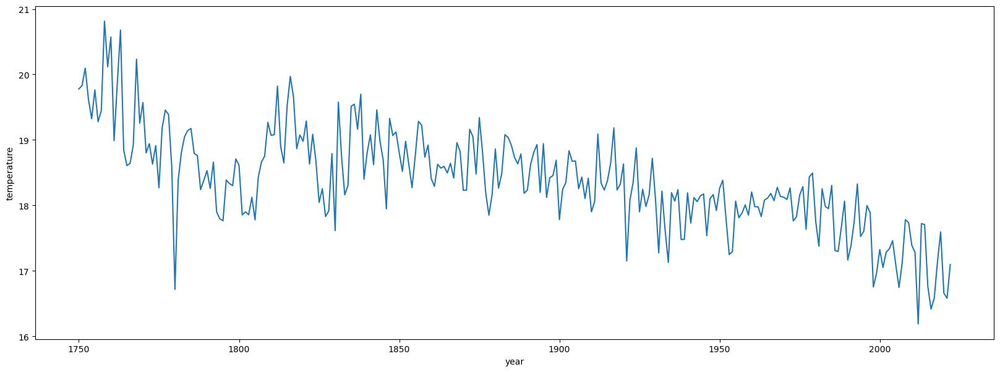

In [91]:
cdd.groupby('time.year').mean(...).plot(figsize=(20, 7))

<h1>Northern Hemisphere</h1>

In [183]:
northern_h = avgda['temperature'].where(avgda['land_mask']==1).sel(latitude=slice(0.5, 89.5)).mean('time')

In [184]:
print(northern_h.min())
print(northern_h.max())

<xarray.DataArray 'temperature' ()>
array(-0.65603864)
<xarray.DataArray 'temperature' ()>
array(0.47161123)


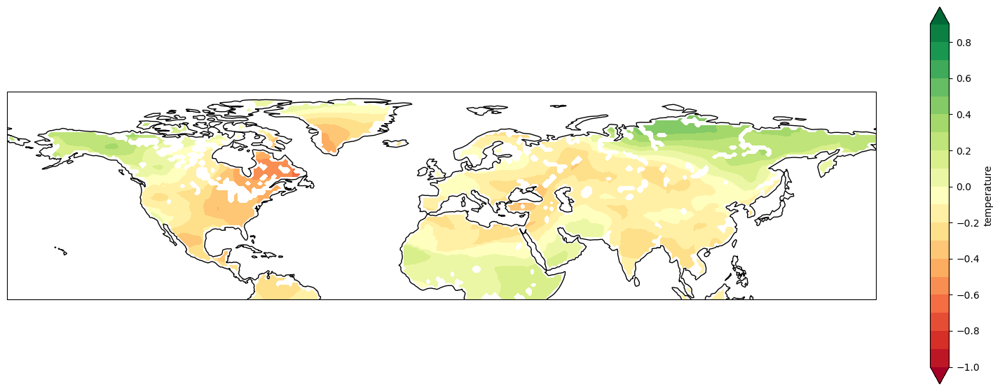

In [185]:
fig = plt.figure(figsize=[20, 7])

ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

northern_h.plot.contourf(ax=ax,
                   extend='both',
                   levels=np.arange(-1, 1, 0.1),
                   alpha=1,
                   transform=ccrs.PlateCarree(),
                   cmap='RdYlGn')
ax.coastlines()

plt.show()

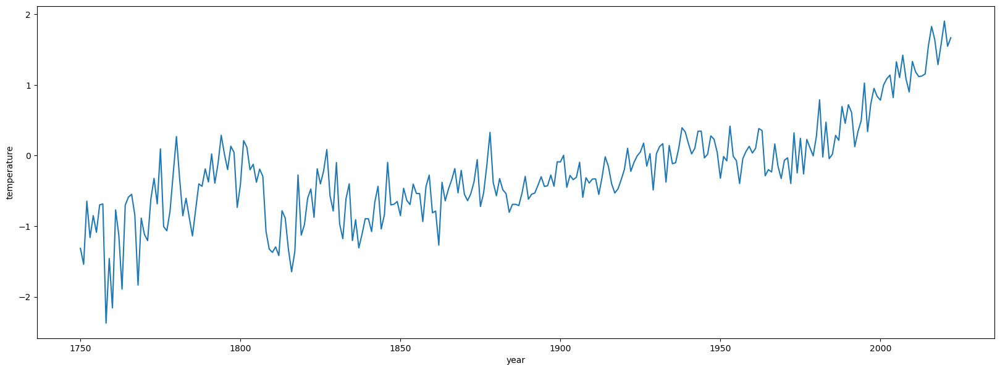

In [214]:
northern_h = avgda['temperature'].where(avgda['land_mask']==1).sel(latitude=slice(0.5, 89.5)).groupby('time.year').mean(...)
northern_h.plot(figsize=(20, 7))
plt.show()

<h1>Southern Hemisphere</h1>

In [186]:
southern_h = avgda['temperature'].where(avgda['land_mask']==1).sel(latitude=slice(-89.5, -0.5)).mean('time')

In [187]:
print(southern_h.min())
print(southern_h.max())

<xarray.DataArray 'temperature' ()>
array(-0.24118674)
<xarray.DataArray 'temperature' ()>
array(0.46711722)


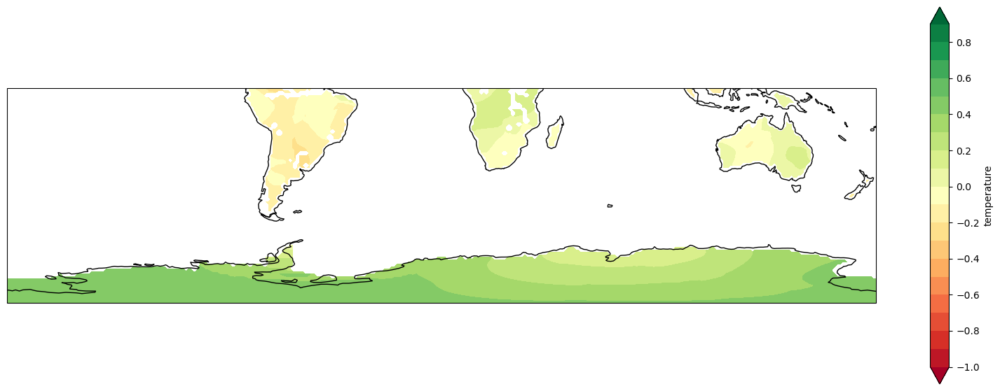

In [188]:
fig = plt.figure(figsize=[20, 7])

ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

southern_h.plot.contourf(ax=ax,
                   extend='both',
                   levels=np.arange(-1, 1, 0.1),
                   alpha=1,
                   transform=ccrs.PlateCarree(),
                   cmap='RdYlGn')
ax.coastlines()

plt.show()

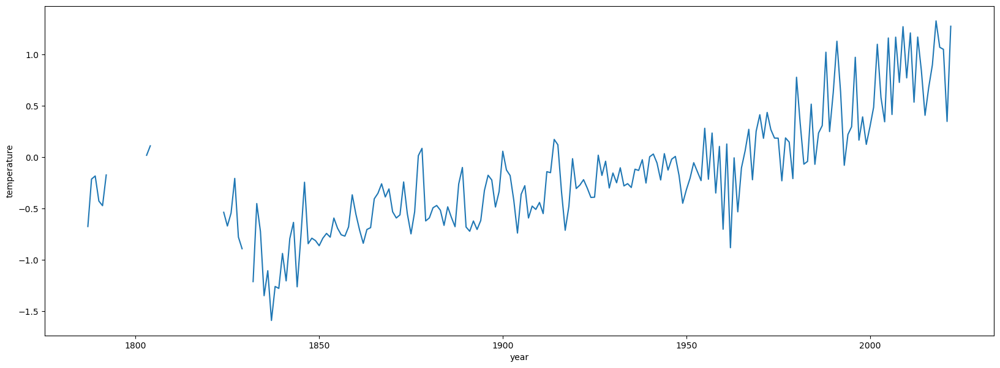

In [211]:
southern_h = avgda['temperature'].where(avgda['land_mask']==1).sel(latitude=slice(-89.5, -0.5)).groupby('time.year').mean(...)
southern_h.plot(figsize=(20, 7))
plt.show()

<h1>Tropic of Cancer</h1>

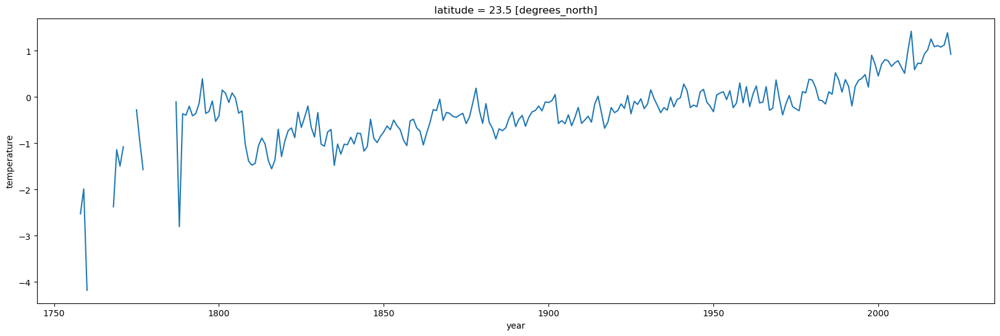

In [212]:
tropic_of_cancer = avgda['temperature'].sel(latitude=23.5).groupby('time.year').mean(...)
tropic_of_cancer.plot(figsize=(20, 6))
plt.show()

<h1>Tropic of Capricon</h1>

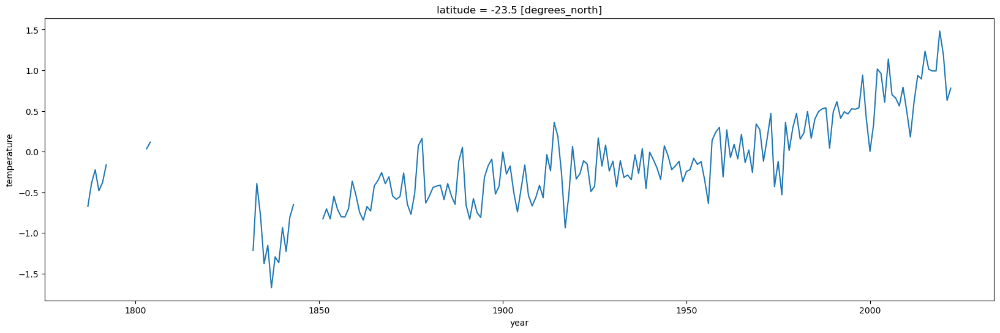

In [213]:
tropic_of_capricon = avgda['temperature'].sel(latitude=-23.5).groupby('time.year').mean(...)
tropic_of_capricon.plot(figsize=(20, 6))
plt.show()

<h1>Antartic Circle</h1>

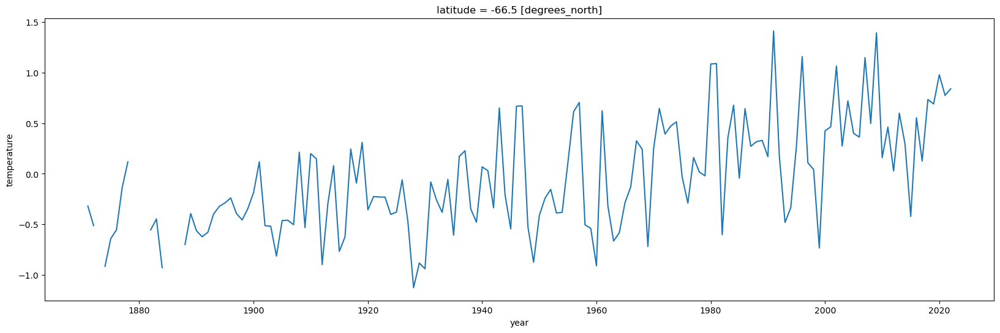

In [215]:
antartic_circle = avgda['temperature'].sel(latitude=-66.5).groupby('time.year').mean(...)
antartic_circle.plot(figsize=(20, 6))
plt.show()

<h1>North America</h1>

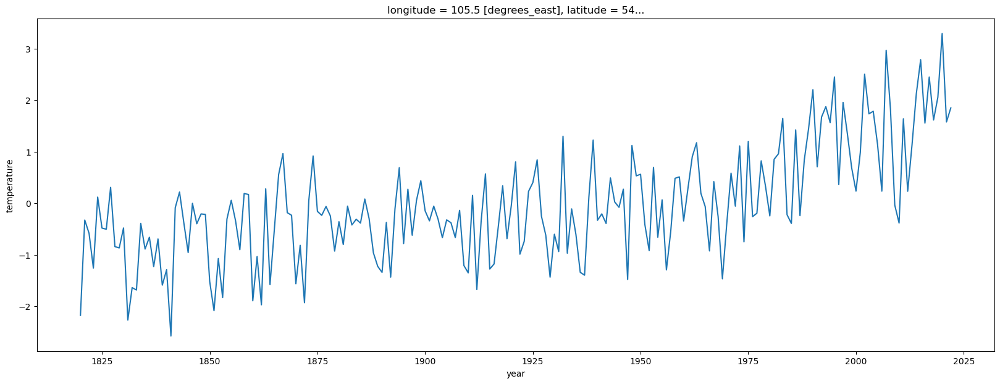

In [217]:
north_america = avgda['temperature'].sel(longitude=105.5, latitude=54.5).groupby('time.year').mean('time')
north_america.plot(figsize=(20, 7))
plt.show()

<h1>Mann-Kendall Test</h1>

In [236]:
average_temperature = analysis_avgda.groupby('time.year').mean(...)

In [237]:
pmk.original_test(average_temperature)

Mann_Kendall_Test(trend='increasing', h=True, p=0.0, z=13.48905626600985, Tau=0.5477806507218272, s=20338.0, var_s=2273058.6666666665, slope=0.007453824219743487, intercept=-1.3900235878617073)